In [1]:
import keras
import tensorflow as tf
import gdal
import os
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from keras_unet.models import custom_unet, satellite_unet
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance
from keras_unet.utils import plot_segm_history

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [2]:
base_dir = Path(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20')
mask_dir = base_dir.joinpath('masks_img')
image_dir = Path(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/training/img')
water_dir = mask_dir.joinpath('water')
shrubs_dir = mask_dir.joinpath('shrub')
trees_dir = mask_dir.joinpath('tree')
low_dir = mask_dir.joinpath('low')

In [3]:
test = gdal.Open(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/training/img/img_1.tif', gdal.GA_ReadOnly)

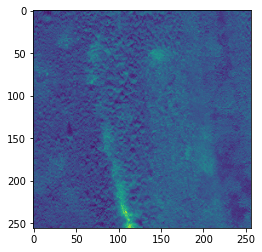

In [4]:
plt.imshow(test.GetRasterBand(1).ReadAsArray())

In [5]:
def make_path(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}_{number}.tif")

In [6]:
def img_number(fpath: str) -> int:
    return int(os.path.splitext(os.path.split(fpath)[1])[0].split('_')[-1])

In [7]:
import typing as t

def load_image_rgb(path: str, shape: t.Tuple[int,int,int], dtype) -> np.ndarray:
    image = np.zeros(shape = shape, dtype=dtype)
    ds= gdal.Open(path, gdal.GA_ReadOnly)
    for i in (1, 2, 3):
        image[:, :, i-1] = ds.GetRasterBand(i).ReadAsArray()
    return image



In [8]:
def load_image(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()

In [9]:
def load_stack_rgb(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        # subsets for rgb bands only
        stack[i, :, :, :] = load_image_rgb(image_path, (shape[1], shape[2], shape[3]), dtype)
    return stack

# need to skip when there is no mask
# loads single band mask
def load_stack_safely(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        if not os.path.isfile(image_path):
            print("skipping", image_path)
            continue
        stack[i, :, :] = load_image(image_path)
    return stack

In [10]:
# training total data size
I = 225
# image dim 1
N = 256
# image dim 2
M = 256
# number of image bands
L = 3
# number of classes
V = 4

In [11]:
train_images = load_stack_rgb((I, N, M, L), np.int8, image_dir, "img")
train_images_R = train_images.reshape(I, N, M, L)

In [12]:
train_images_R.shape

(225, 256, 256, 3)

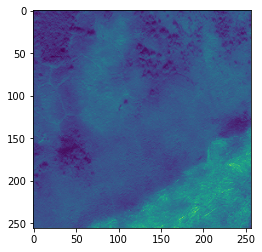

In [13]:
plt.imshow(train_images[1, :,:,1])

In [14]:
water_mask = load_stack_safely((I, N, M), np.int8, water_dir, "water")
trees_mask = load_stack_safely((I, N, M), np.int8, trees_dir, "tree")
shrubs_mask = load_stack_safely((I, N, M), np.int8, shrubs_dir, "shrub")
low_mask = load_stack_safely((I, N, M), np.int8, low_dir, "low")

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_1.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_2.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_3.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_4.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_6.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_9.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_16.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_17.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_20.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/water/water_21.tif
skipping /media/hkropp/research/Koly

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_19.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_24.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_26.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_28.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_29.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_33.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_36.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_40.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_41.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/shrub/shrub_45.tif
skipping /media/hkropp/researc

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_31.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_32.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_33.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_34.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_35.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_36.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_37.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_38.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_39.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/masks_img/low/low_40.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net20/ma

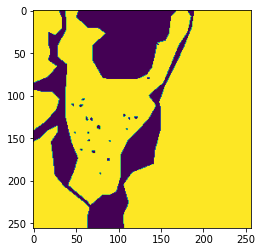

In [15]:
plt.imshow(low_mask[203, :,:])

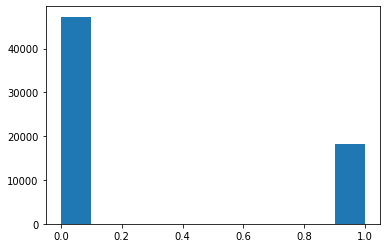

In [16]:
plt.hist(water_mask[9, :,:].flatten())
plt.show()

In [17]:
trees_mask.shape

(225, 256, 256)

In [18]:
test_sub = trees_mask[100:125, :, :]

In [19]:
test_sub.shape

(25, 256, 256)

In [20]:
# Hold images 100-125 for testing threshold

W = 200
Y = np.zeros(shape=(W, N, M, V), dtype =np.int8)
Y_train_img = np.zeros(shape=(W, N, M, L), dtype =np.float32)

Y[0:100, :, :, 0] = trees_mask[0:100, :, :]
Y[0:100, :, :, 1] = water_mask[0:100, :, :]
Y[0:100, :, :, 2] = shrubs_mask[0:100, :, :]
Y[0:100, :, :, 3] = low_mask[0:100, :, :]
Y_train_img[0:100, :, :, :] = train_images_R[0:100, :, :, :]

Y[100:200, :, :, 0] = trees_mask[125:225, :, :]
Y[100:200, :, :, 1] = water_mask[125:225, :, :]
Y[100:200, :, :, 2] = shrubs_mask[125:225, :, :]
Y[100:200, :, :, 3] = low_mask[125:225, :, :]
Y_train_img[100:200, :, :, :] = train_images_R[125:225, :, :, :]



In [21]:
K = 25
Y_valid = np.zeros(shape=(K, N, M, V), dtype =np.int8)
Y_valid_img = np.zeros(shape=(K, N, M, L), dtype =np.float32)

Y_valid[0:25, :, :, 0] = trees_mask[100:125, :, :]
Y_valid[0:25, :, :, 1] = water_mask[100:125, :, :]
Y_valid[0:25, :, :, 2] = shrubs_mask[100:125, :, :]
Y_valid[0:25, :, :, 3] = low_mask[100:125, :, :]
Y_valid_img[0:25, :, :, :] = train_images_R[100:125, :, :, :]

In [22]:
Y.shape

(200, 256, 256, 4)

In [23]:
Y_train_img.shape

(200, 256, 256, 3)

In [24]:
Y_valid.shape

(25, 256, 256, 4)

In [25]:
Y_valid_img.shape

(25, 256, 256, 3)

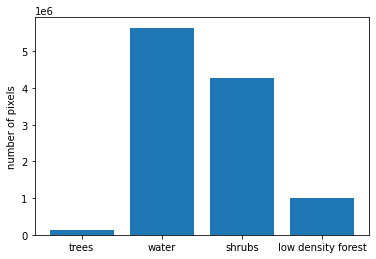

In [26]:
fig, ax = plt.subplots()
ax.bar(range(V), [trees_mask.sum(), water_mask.sum(), shrubs_mask.sum(), low_mask.sum()])
ax.set_xticks((0, 1, 2, 3))
ax.set_xticklabels(('trees', 'water', 'shrubs', 'low density forest'))
plt.ylabel('number of pixels')
plt.show()

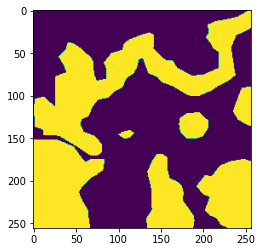

In [27]:
plt.imshow(Y[3,:,:,2])

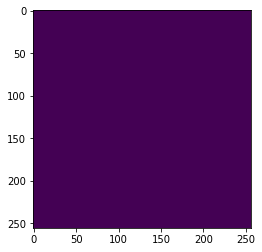

In [28]:
plt.imshow(water_mask[3,:, :])

In [29]:
model = satellite_unet((N, M, 3), V)

In [30]:
model.compile(
    optimizer = tf.keras.optimizers.Adam(),
    loss = "binary_crossentropy",
    metrics = [iou, iou_thresholded],
)

In [31]:
history = model.fit(Y_train_img, Y, epochs = 200)

Epoch 1/200
7/7 [==============================] - 33s 4s/step - loss: 0.5275 - iou: 0.3519 - iou_thresholded: 0.4570
Epoch 2/200
7/7 [==============================] - 26s 4s/step - loss: 0.1948 - iou: 0.5766 - iou_thresholded: 0.6825
Epoch 3/200
7/7 [==============================] - 26s 4s/step - loss: 0.1671 - iou: 0.6113 - iou_thresholded: 0.6867
Epoch 4/200
7/7 [==============================] - 26s 4s/step - loss: 0.1644 - iou: 0.5862 - iou_thresholded: 0.6718
Epoch 5/200
7/7 [==============================] - 26s 4s/step - loss: 0.1650 - iou: 0.5997 - iou_thresholded: 0.6804
Epoch 6/200
7/7 [==============================] - 26s 4s/step - loss: 0.1483 - iou: 0.6040 - iou_thresholded: 0.7078
Epoch 7/200
7/7 [==============================] - 26s 4s/step - loss: 0.1682 - iou: 0.6119 - iou_thresholded: 0.7103
Epoch 8/200
7/7 [==============================] - 26s 4s/step - loss: 0.1449 - iou: 0.6515 - iou_thresholded: 0.7510
Epoch 9/200
7/7 [==============================] - 26s 4

7/7 [==============================] - 25s 4s/step - loss: 0.0896 - iou: 0.7483 - iou_thresholded: 0.8253
Epoch 70/200
7/7 [==============================] - 25s 4s/step - loss: 0.0839 - iou: 0.7775 - iou_thresholded: 0.8449
Epoch 71/200
7/7 [==============================] - 25s 4s/step - loss: 0.0920 - iou: 0.7710 - iou_thresholded: 0.8186
Epoch 72/200
7/7 [==============================] - 25s 4s/step - loss: 0.0879 - iou: 0.7477 - iou_thresholded: 0.8093
Epoch 73/200
7/7 [==============================] - 25s 4s/step - loss: 0.0902 - iou: 0.7539 - iou_thresholded: 0.8259
Epoch 74/200
7/7 [==============================] - 25s 4s/step - loss: 0.0931 - iou: 0.7836 - iou_thresholded: 0.8376
Epoch 75/200
7/7 [==============================] - 25s 4s/step - loss: 0.0777 - iou: 0.7725 - iou_thresholded: 0.8357
Epoch 76/200
7/7 [==============================] - 25s 4s/step - loss: 0.0780 - iou: 0.8001 - iou_thresholded: 0.8545
Epoch 77/200
7/7 [==============================] - 25s 4s/st

7/7 [==============================] - 26s 4s/step - loss: 0.0649 - iou: 0.8090 - iou_thresholded: 0.8539
Epoch 138/200
7/7 [==============================] - 26s 4s/step - loss: 0.0595 - iou: 0.8351 - iou_thresholded: 0.8836
Epoch 139/200
7/7 [==============================] - 26s 4s/step - loss: 0.0556 - iou: 0.8136 - iou_thresholded: 0.8777
Epoch 140/200
7/7 [==============================] - 25s 4s/step - loss: 0.0526 - iou: 0.8508 - iou_thresholded: 0.8979
Epoch 141/200
7/7 [==============================] - 26s 4s/step - loss: 0.0605 - iou: 0.8197 - iou_thresholded: 0.8734
Epoch 142/200
7/7 [==============================] - 26s 4s/step - loss: 0.0551 - iou: 0.8421 - iou_thresholded: 0.8883
Epoch 143/200
7/7 [==============================] - 25s 4s/step - loss: 0.0538 - iou: 0.8420 - iou_thresholded: 0.8833
Epoch 144/200
7/7 [==============================] - 26s 4s/step - loss: 0.0584 - iou: 0.8210 - iou_thresholded: 0.8651
Epoch 145/200
7/7 [==============================] - 2

In [138]:
modelsave_path = Path(r'/media/hkropp/research/Kolyma_Data/training/model/2020')

In [139]:
model.save(modelsave_path)

INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/2020/assets


INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/2020/assets


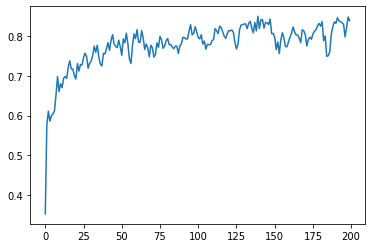

In [32]:
plt.plot(history.history['iou'])

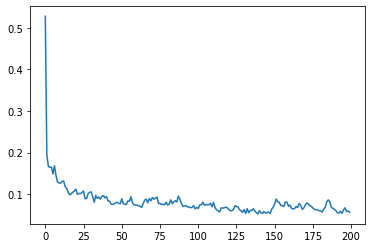

In [33]:
plt.plot(history.history['loss'])

In [35]:
Y_pred = model.predict(Y_train_img)

7/7 [==============================] - 10s 1s/step


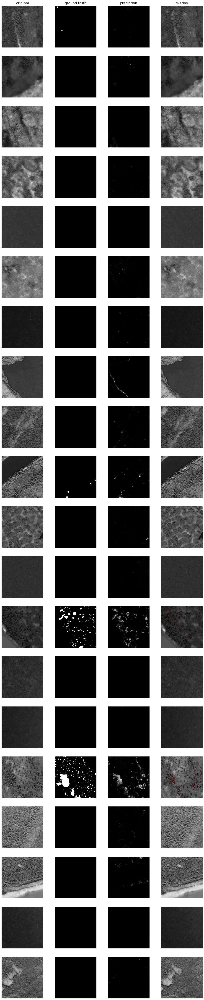

In [37]:
from keras_unet.utils import plot_imgs

# trees
plot_imgs(
    org_imgs=Y_train_img.reshape(200, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

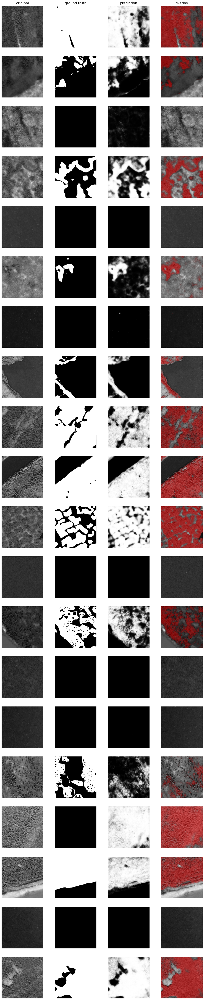

In [38]:
# Shrubs
plot_imgs(
    org_imgs=Y_train_img.reshape(200, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 2], 
    pred_imgs=Y_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

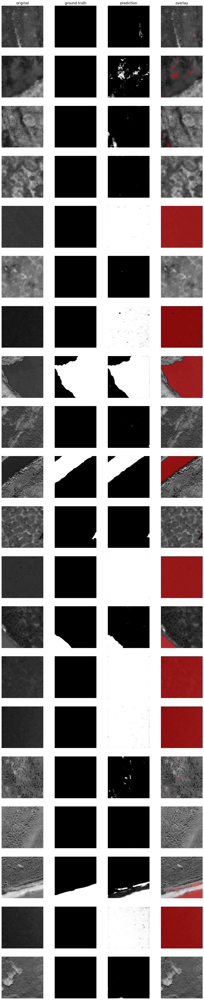

In [39]:
# water
plot_imgs(
    org_imgs=Y_train_img.reshape(200, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 1], 
    pred_imgs=Y_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

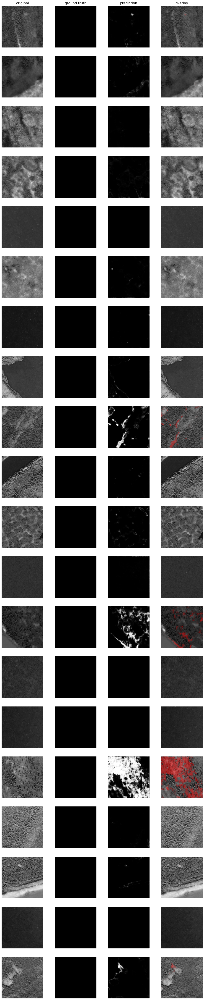

In [40]:
# Low density forest
plot_imgs(
    org_imgs=Y_train_img.reshape(200, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 3], 
    pred_imgs=Y_pred[:, :, :, 3], 
    nm_img_to_plot=20
  )

In [41]:
valid_pred = model.predict(Y_valid_img)

1/1 [==============================] - 1s 1s/step


In [42]:
valid_pred[1,:, :, 0]

array([[1.9852584e-02, 6.1969152e-03, 6.3453047e-03, ..., 9.5506944e-03,
        1.4192800e-02, 2.4003020e-02],
       [9.9919960e-03, 1.7139985e-03, 5.7587301e-04, ..., 1.9539215e-03,
        3.3725372e-03, 7.0298864e-03],
       [1.2762871e-02, 6.2466292e-03, 1.2013224e-03, ..., 2.2058843e-03,
        4.0238369e-03, 5.4280711e-03],
       ...,
       [8.8039105e-04, 2.4118615e-05, 1.3911322e-05, ..., 2.5168765e-06,
        1.2688282e-06, 1.0872633e-04],
       [1.3504038e-03, 5.5300869e-05, 3.3939814e-05, ..., 4.5187180e-06,
        5.7145421e-06, 3.2953106e-04],
       [1.5060451e-02, 3.1150177e-03, 1.5159509e-03, ..., 2.6885094e-04,
        2.7987832e-04, 8.2907947e-03]], dtype=float32)

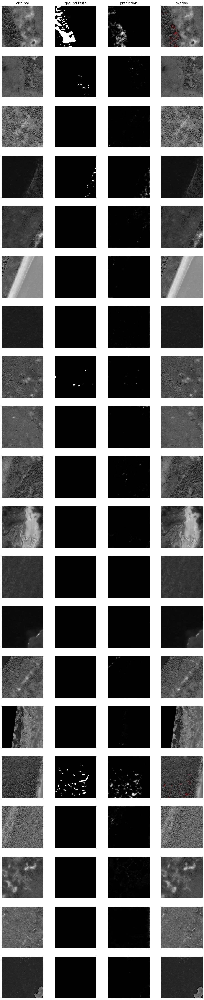

In [44]:
# Trees
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 0], 
    pred_imgs=valid_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

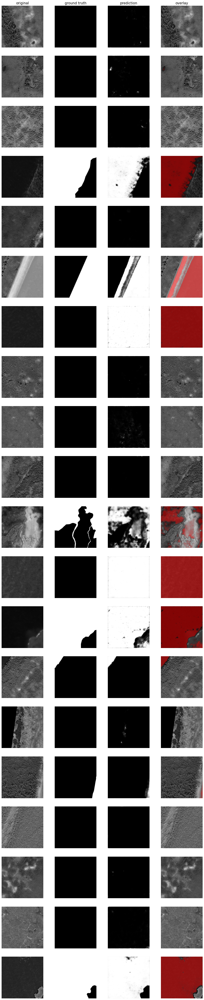

In [45]:
# Water
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 1], 
    pred_imgs=valid_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

In [46]:
waterPredict = valid_pred[:,:,:,1]

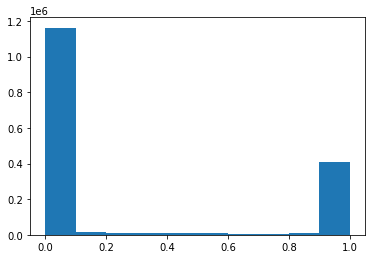

In [47]:
plt.hist(waterPredict.flatten())
plt.show()

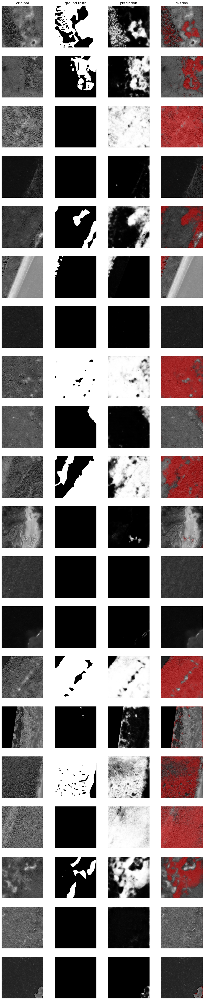

In [48]:
# Shrubs
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 2], 
    pred_imgs=valid_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

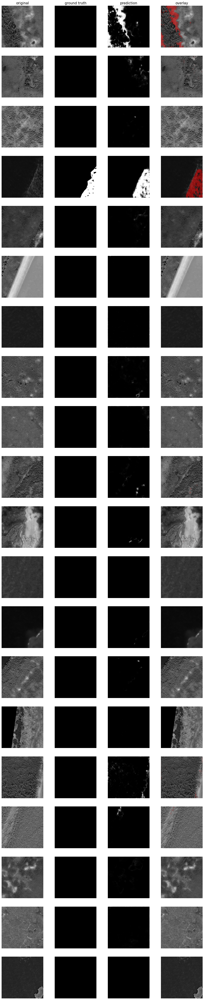

In [49]:
# Low density forest
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 3], 
    pred_imgs=valid_pred[:, :, :, 3], 
    nm_img_to_plot=20
  )

In [50]:
Y_valid[0,0,0,0]

0

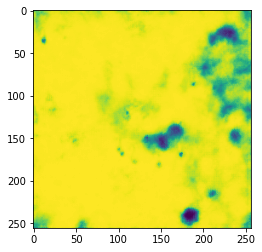

In [52]:
plt.imshow(valid_pred[7,:, :,2])

In [49]:
J, N, M = 400, 256, 256

In [50]:
driver = gdal.GetDriverByName("GTiff")

In [51]:
driver.Register()

2

In [58]:
def save_predict_validT( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(360,400):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i-360,:,:,0])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [59]:
tree_valid_dir = r'/media/studentuser/Seagate Portable Drive/predictions_71/valid/tree'
save_predict_validT(nImg = 40,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = image_dir , prefix_orig = "img")

In [60]:
def save_predict_validW( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(360,400):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i-360,:,:,1])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [64]:
water_valid_dir = r'/media/studentuser/Seagate Portable Drive/predictions_71/valid/water'
save_predict_validW(nImg = 40,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = image_dir , prefix_orig = "img")

In [65]:
def save_predict_validS( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(360,400):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i-360,:,:,2])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [66]:
shrub_valid_dir = r'/media/studentuser/Seagate Portable Drive/predictions_71/valid/shrub'
save_predict_validS(nImg = 40,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = image_dir , prefix_orig = "img")

In [67]:
def save_predict_validL( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(360,400):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i-360,:,:,3])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [68]:
lowD_valid_dir = r'/media/studentuser/Seagate Portable Drive/predictions_71/valid/lowD'
save_predict_validL(nImg = 40,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = image_dir , prefix_orig = "img")

In [69]:
base_dirP = Path(r'/media/studentuser/Seagate Portable Drive/siberia_tiles/tiles_256')

In [78]:
tiles = os.listdir(base_dirP)

In [120]:
T = len(tiles)

In [122]:
def load_stack_tiles(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = os.path.join(base_dirP, tiles[i])
        if not os.path.isfile(image_path):
            print("skipping", image_path)
            continue
        stack[i, :, :] = load_image(tilepath)
    return stack

In [127]:
predict_img = load_stack_tiles((T, N, M), np.float32,base_dirP, "img")

In [128]:
predict_img.shape

(19825, 256, 256)

In [134]:
Y_all = model.predict(predict_img.reshape(T, N, M, 1))

620/620 [==============================] - 910s 1s/step


In [145]:
def save_predict_tree( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = os.path.join(base_dirP, tiles[i])
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [146]:
tree_valid_dir = r'/media/studentuser/Seagate Portable Drive/predictions_71/all/tree'
save_predict_tree(nImg = 40,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = base_dirP , prefix_orig = "img")

In [147]:
def save_predict_water( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = os.path.join(base_dirP, tiles[i])
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [148]:
water_valid_dir = r'/media/studentuser/Seagate Portable Drive/predictions_71/all/water'
save_predict_water(nImg = 40,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = base_dirP , prefix_orig = "img")

In [149]:
def save_predict_shrub( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = os.path.join(base_dirP, tiles[i])
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [150]:
shrub_valid_dir = r'/media/studentuser/Seagate Portable Drive/predictions_71/all/shrub'
save_predict_shrub(nImg = 40,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = base_dirP , prefix_orig = "img")

In [151]:
def save_predict_lowD( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = os.path.join(base_dirP, tiles[i])
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 3])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [152]:
lowD_valid_dir = r'/media/studentuser/Seagate Portable Drive/predictions_71/all/lowD'
save_predict_lowD(nImg = 40,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = base_dirP , prefix_orig = "img")